# Prep

Setting up some prior functionality

Download the DETR repository that has been updated with the clearML experiment tracking code
Also import torch and check if a GPU is available

In [1]:
# This is for when running in colab
!git clone https://github.com/thepycoder/detr.git
!git clone https://github.com/thepycoder/dragon_data

Cloning into 'detr'...
remote: Enumerating objects: 357, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 357 (delta 0), reused 1 (delta 0), pack-reused 353
Receiving objects: 100% (357/357), 22.69 MiB | 3.45 MiB/s, done.
Resolving deltas: 100% (199/199), done.
Cloning into 'dragon_data'...
remote: Enumerating objects: 28, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (17/17), done.
remote: Total 28 (delta 11), reused 25 (delta 8), pack-reused 0
Unpacking objects: 100% (28/28), done.


In [6]:
import torch, torchvision
from datetime import datetime
print(torch.__version__, torch.cuda.is_available())

1.10.0 True


# Patch DETR

The main entrypoint in the original DETR code is the `main.py` script, which contains the main training loop. To start tracking our training runs in clearML we simply have to add 2 lines of code this script and we're off to the races!

You can check this change in `main.py` starting from line 19.
```python
# Imports ...

# Initialise a clearML task and its corresponding logger
from clearml import Task
task = Task.init(project_name='dragon_detector', task_name=f'DETR')

# Rest of code ...
```

These 2 lines will already log all hyperparameters used, console output, code changes and much more.

![parameters](images/parameters.png)

![artifacts](images/artifacts.png)

![console](images/console.png)

## Manually adding scalars

When using popular frameworks like detectron2, tensorboard and others, scalars (e.g. loss, mAP etc.) will automatically be logged by clearML. But in case you have a model implementation where this does not happen automatically, it's still very easy to add parameters to log manually.

First, we add a clearML logger. Ideally, we place it under the 2 magic lines of code we just put in.

You can check this change in `main.py` starting from line 22.
```python
# Imports ...

# Initialise a clearML task and its corresponding logger
from clearml import Task
task = Task.init(project_name='dragon_detector', task_name=f'DETR')
logger = task.get_logger()

# Rest of code ...
```

Next, we can use this logger to add anything we want to the clearML report. In this case, DETR already keeps track of many important variables such as epoch number, all different losses for that epoch, training and testing accuracy etc. It keeps track of these metrics in a dict, so all we have to do is add this dict to our logger and BOOM! We're tracking them!

In this case we did some additional things: we only log these metrics every 10 epochs and filter out the `coco_eval_bbox` key from the dictionary as it is not a metric, but a bounding box which is difficult to plot...

```python

# Original DETR evaluation step
test_stats, coco_evaluator = evaluate(
    model, criterion, postprocessors, data_loader_val, base_ds, device, args.output_dir
)

# Original DETR dict containing metrics
log_stats = {**{f'train_{k}': v for k, v in train_stats.items()},
                **{f'test_{k}': v for k, v in test_stats.items()},
                'epoch': epoch,
                'n_parameters': n_parameters}

# Added ClearML tracking
if epoch % 10 == 0:
    for key, value in log_stats.items():
        if 'coco_eval_bbox' in key:
            continue
        logger.report_scalar(title=key, series=key, value=value, iteration=epoch)

```

In the clearML dashboard, you'll find these metrics under Results -> Scalars and they'll be plotted for you.

![clearml scalar view](images/scalars.png)



## Manually adding debug samples

Finally, we would like to add Debug Samples. This is where you can log images and their detections straight to the clearML dashboard, so we can visually see that our training has worked!
Again, if using something like tensorboard, debug images will be captured automatically but DETR did not evaluate any images in it's training loop, so we'll have to add a little more code now to get them.


First, we're mainly interested in the detection quality at the end of training. So we add a custom function at the complete end of the training script, that will run evaluation with the currently trained model on all the validation images and log them to clearML.

In `main.py` we add a function call to run evaluation on validation images: line 263 (last line)
```python
# Main entrypoint of training script
if __name__ == '__main__':
    parser = argparse.ArgumentParser('DETR training and evaluation script', parents=[get_args_parser()])
    args = parser.parse_args()
    if args.output_dir:
        Path(args.output_dir).mkdir(parents=True, exist_ok=True)
    main(args)
    run_visual_validation(args, ['dragon'], logger)
```

The `run_visual_validation` function loads the model we just trained and sends a call to `run_visual_validation_workflow` for every validation image we have.
```python
def run_visual_validation(args, classes, logger):
    # Get the model ready
    model = torch.hub.load('facebookresearch/detr',
                           'detr_resnet50',
                           pretrained=False,
                           num_classes=args.num_classes)
    checkpoint = torch.load(Path(args.output_dir) / 'checkpoint.pth',
                            map_location='cpu')

    model.load_state_dict(checkpoint['model'],
                          strict=False)
    model.eval()

    # Iterate over the validation folder and run the model. For visual feedback.
    val_folder = Path(args.coco_path) / 'val'
    for img_name in os.listdir(val_folder):
        im = Image.open(Path(val_folder) / img_name)
        run_visual_validation_workflow(im, model, classes, logger, img_name)
```

The `run_visual_validation_workflow` on it's turn will take the validation image, normalize it, run it through the model, filter the predictions on a threshold and send the result out to be plotted.
```python
def run_visual_validation_workflow(my_image, my_model, classes, logger, img_name):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                             img,
                                                             threshold=0.35)

  plot_image_results(my_image,
                     probas_to_keep,
                     bboxes_scaled,
                     classes,
                     logger,
                     img_name)
```

Finally, `plot_image_results` will make a matplotlib image from the validation image and the relevant predictions. Then with the single line `logger.report_matplotlib_figure` we send that matplotlib image to clearML. This is the only actual clearML line of code you need, the rest is needed to create the images.
```python
def plot_image_results(pil_img, prob, boxes, classes, logger, img_name):
    # colors for visualization
    colors = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
              [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]
    colors = colors * 100
    figure = plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        text = f'{classes[cl]}: {p[cl]:0.2f}'
        ax.text(xmin, ymin, text, fontsize=15,
                bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.savefig(img_name)
    logger.report_matplotlib_figure('Evaluation Results', img_name, figure,
                                    iteration=None, report_image=True,
                                    report_interactive=False)
```


# Initialise ClearML

In order to start tracking you experiments you'll need a free clearML account to send data to the community server or you can always host your own server too!

In [3]:
# Preferably run this in a terminal if you can, but if in a (colab) notebook, the input is not recognised properly. Press enter once, to give clearml-init an empty input and then fill in the fields one at a time.
!pip install clearml
!clearml-init

ClearML SDK setup process
Configuration file already exists: /root/clearml.conf
Leaving setup, feel free to edit the configuration file.


The rest of the clearml-specific code is added in the `main.py` file and will keep track of every time it is ran from here. Keeping track of all the variables, arguments, metrics, model files and so on.

# Get the data

Let's download the data to our disk by using the `get_dataset.py` script from the repo.

In [4]:
%cd dragon_data
!python get_dataset.py

/content/dragon_data
100%|███████████████████████████████████████████| 10/10 [00:01<00:00,  6.48it/s]


Next we can load the dataset to clearML and start tracking changes. This code can be found standalone in the `create_clearml_dataset.ipynb` file in the dragon data repository.

In [29]:
from clearml import Dataset

# Create the dataset to later upload to the clearML server
dataset = Dataset.create(
  dataset_name='dragon_detector',
  dataset_project='dragons'
)

# Add our files to the dataset
# Training images
dataset.add_files(
    path='data/train',
    dataset_path='data/train',
    recursive=True
)

# Validation images
dataset.add_files(
    path='data/val',
    dataset_path='data/val',
    recursive=True
)

# And annotations
dataset.add_files(
    path='annotations',
    dataset_path='annotations',
    recursive=True
)

# Then upload and finalise the dataset
dataset.upload()
dataset.finalize()

ValueError: ("Could not find file/folder '{}'", 'data/train')

In [ ]:
# We can take a quick look to see if the files were added correctly
dataset.list_files()[:5]

['annotations/train.json',
 'annotations/train.txt',
 'annotations/val.json',
 'annotations/val.txt',
 'data/train/2CovKmD.jpeg']

# Load a model

Since the data in our dragon dataset is limited, our model should be pretrained. 

This means getting a pretrained model and chopping off the class head, so we can retrain that part only.

In [ ]:
%cd /content/detr
!pip install -r requirements.txt
!pip install pandas seaborn

/content/detr
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-install-z1qjg9w0/pycocotools_93ee5e44ce134c85b15348336a0331c6
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-install-z1qjg9w0/pycocotools_93ee5e44ce134c85b15348336a0331c6
  Cloning https://github.com/cocodataset/panopticapi.git to /tmp/pip-install-z1qjg9w0/panopticapi_6d4eb8b9c09f45e6a6228b60e8db8c32
  Running command git clone -q https://github.com/cocodataset/panopticapi.git /tmp/pip-install-z1qjg9w0/panopticapi_6d4eb8b9c09f45e6a6228b60e8db8c32


In [ ]:
# Get pretrained weights
checkpoint = torch.hub.load_state_dict_from_url(
    url='https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth',
    map_location='cpu',
    check_hash=True)

# Remove class weights
del checkpoint["model"]["class_embed.weight"]
del checkpoint["model"]["class_embed.bias"]

# SaveOGH
torch.save(checkpoint, 'detr-r50_no-class-head.pth')

# Dataset

Our dataset should be loadable as a COCO format

This allows us to use the pycocotools to load the data dict for the main python script

In [30]:
dataset_file = "dragons" # alternatively, implement your own coco-type dataset loader in datasets and add this "key" to datasets/__init__.py

dataDir='/content/dragon_data/data' # should lead to a directory with a train and val folder as well as an annotations folder
num_classes = 2 # this int should be the amount of classes + 1

outDir = f'outputs_{datetime.now().strftime("%m:%d:%Y_%H:%M:%S")}'
resume = "detr-r50_no-class-head.pth"

# Training

We use the main.py script to run our training

In [34]:
# We need at least 100 epochs for the dragons to be detected somewhat decently. It seems to be a difficult class.
!python main.py \
  --dataset_file $dataset_file \
  --coco_path $dataDir \
  --output_dir $outDir \
  --resume $resume \
  --start_epoch 100 \
  --num_classes $num_classes \
  --lr 1e-5 \
  --lr_backbone 1e-6 \
  --epochs 101

ClearML Task: created new task id=f7425c3d06f14a23806cd79c83fd9182
ClearML results page: https://app.community.clear.ml/projects/8131d2f23983461f8354156be95bc4f1/experiments/f7425c3d06f14a23806cd79c83fd9182/output/log
Not using distributed mode
git:
  sha: 1aa379c6cd4b0d50690ba41d365f5f608317f994, status: clean, branch: master

Namespace(aux_loss=True, backbone='resnet50', batch_size=2, bbox_loss_coef=5, clip_max_norm=0.1, coco_panoptic_path=None, coco_path='/content/dragon_data/data', dataset_file='dragons', dec_layers=6, device='cuda', dice_loss_coef=1, dilation=False, dim_feedforward=2048, dist_url='env://', distributed=False, dropout=0.1, enc_layers=6, eos_coef=0.1, epochs=101, eval=False, frozen_weights=None, giou_loss_coef=2, hidden_dim=256, lr=1e-05, lr_backbone=1e-06, lr_drop=200, mask_loss_coef=1, masks=False, nheads=8, num_classes=2, num_queries=100, num_workers=2, output_dir='outputs', position_embedding='sine', pre_norm=False, remove_difficult=False, resume='detr-r50_no-cla

# Results

Quick and easy overview of the training results, an interactive version of these graphs should be visible on your clearML dashboard!

In [19]:
from util.plot_utils import plot_logs
from pathlib import Path

log_directory = [Path(outDir)]

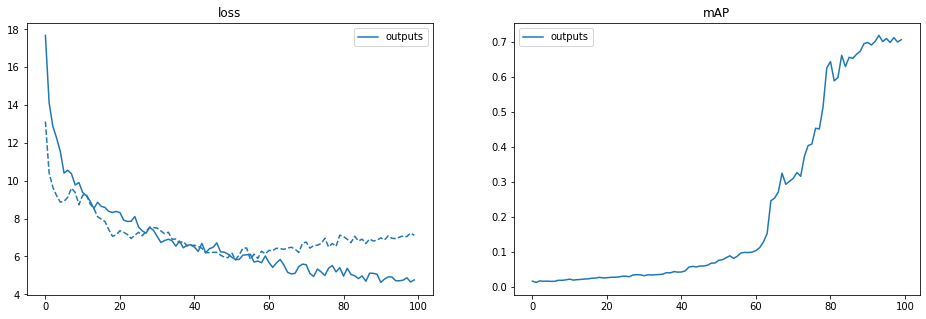

In [20]:
fields_of_interest = (
    'loss',
    'mAP',
    )

plot_logs(log_directory,
          fields_of_interest)

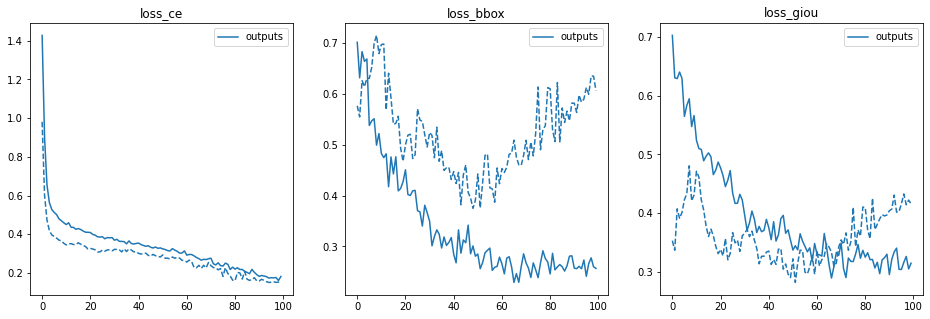

In [21]:
fields_of_interest = (
    'loss_ce',
    'loss_bbox',
    'loss_giou',
    )

plot_logs(log_directory,
          fields_of_interest)

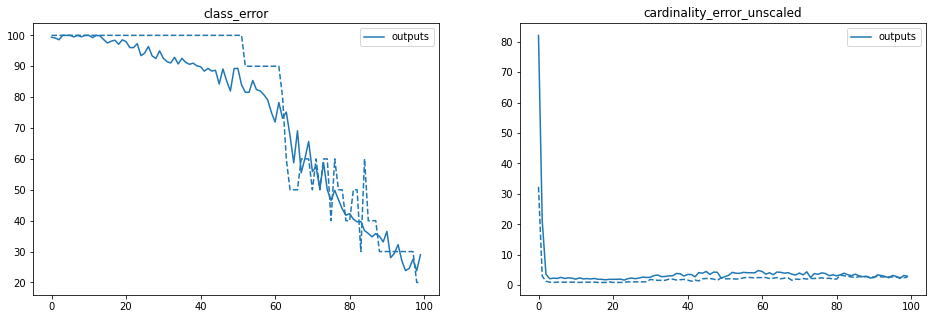

In [22]:
fields_of_interest = (
    'class_error',
    'cardinality_error_unscaled',
    )

plot_logs(log_directory,
          fields_of_interest)   

# Visualise results

It's always nice to be able to view your results, this same code is also used to upload these samples to the clearML dashboard after a training run.

In [23]:
model = torch.hub.load('facebookresearch/detr',
                       'detr_resnet50',
                       pretrained=False,
                       num_classes=num_classes)

checkpoint = torch.load('outputs/checkpoint.pth',
                        map_location='cpu')

model.load_state_dict(checkpoint['model'],
                      strict=False)

model.eval()

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main


DETR(
  (transformer): Transformer(
    (encoder): TransformerEncoder(
      (layers): ModuleList(
        (0): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_features=2048, bias=True)
          (dropout): Dropout(p=0.1, inplace=False)
          (linear2): Linear(in_features=2048, out_features=256, bias=True)
          (norm1): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (norm2): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
          (dropout1): Dropout(p=0.1, inplace=False)
          (dropout2): Dropout(p=0.1, inplace=False)
        )
        (1): TransformerEncoderLayer(
          (self_attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=256, out_features=256, bias=True)
          )
          (linear1): Linear(in_features=256, out_f

In [24]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

finetuned_classes = ['dragon']

def plot_finetuned_results(pil_img, prob=None, boxes=None):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    if prob is not None and boxes is not None:
      for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
          ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                    fill=False, color=c, linewidth=3))
          cl = p.argmax()
          text = f'{finetuned_classes[cl]}: {p[cl]:0.2f}'
          ax.text(xmin, ymin, text, fontsize=15,
                  bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [27]:
import torchvision.transforms as T

# standard PyTorch mean-std input image normalization
transform = T.Compose([
    T.Resize(800),
    T.ToTensor(),
    T.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_h, img_w = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b


def filter_bboxes_from_outputs(outputs,
                               threshold=0.1):
  
  # keep only predictions with confidence above threshold
  probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values > threshold

  probas_to_keep = probas[keep]

  # convert boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep], im.size)
  
  return probas_to_keep, bboxes_scaled

def run_worflow(my_image, my_model):
  # mean-std normalize the input image (batch-size: 1)
  img = transform(my_image).unsqueeze(0)

  # propagate through the model
  outputs = my_model(img)

  for threshold in [0.7, 0.2]:
    
    probas_to_keep, bboxes_scaled = filter_bboxes_from_outputs(outputs,
                                                              threshold=threshold)

    plot_finetuned_results(my_image,
                           probas_to_keep, 
                           bboxes_scaled)

/root/.cache/torch/hub/facebookresearch_detr_main/models/position_encoding.py:41: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.num_pos_feats)


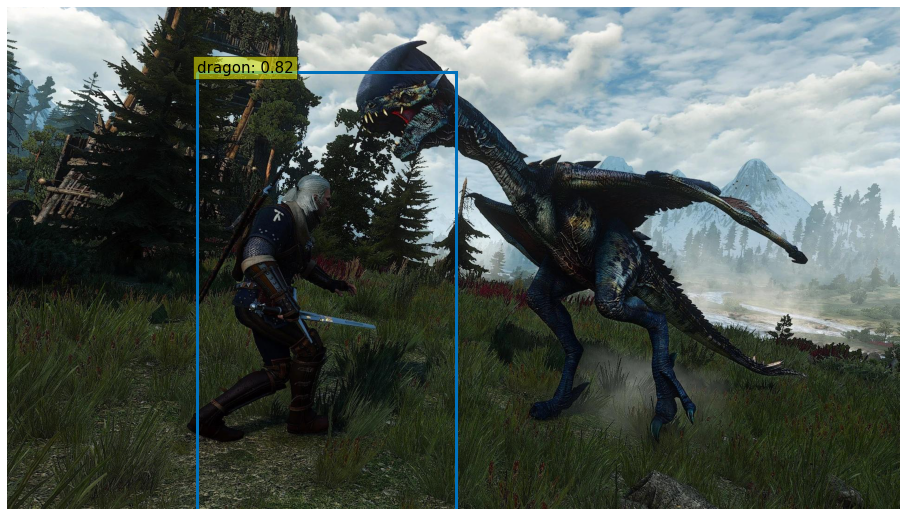

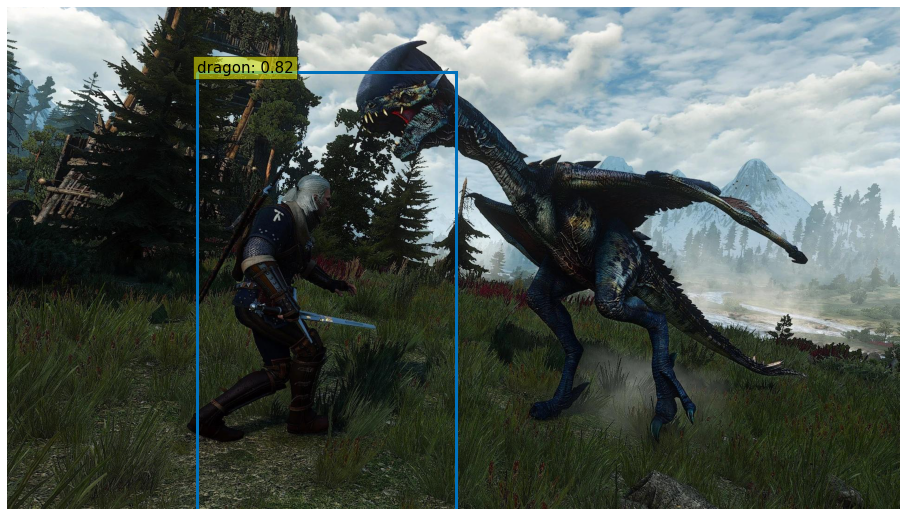

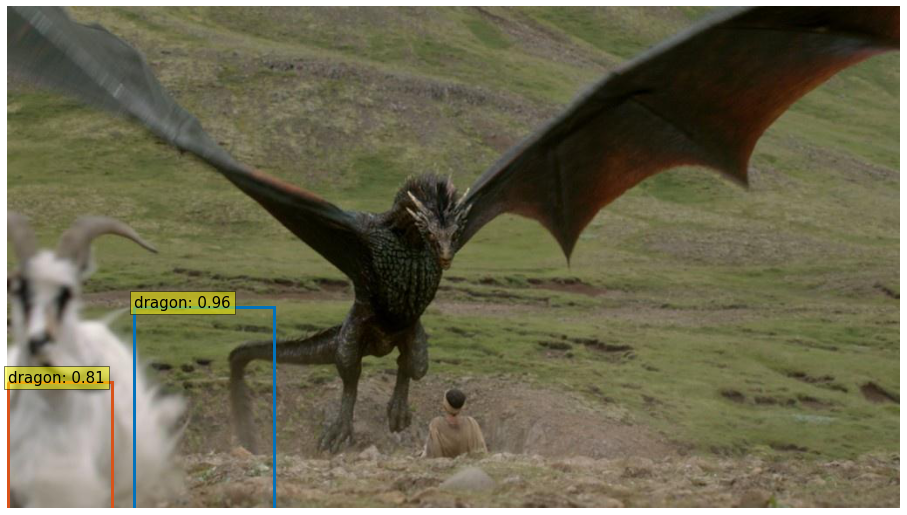

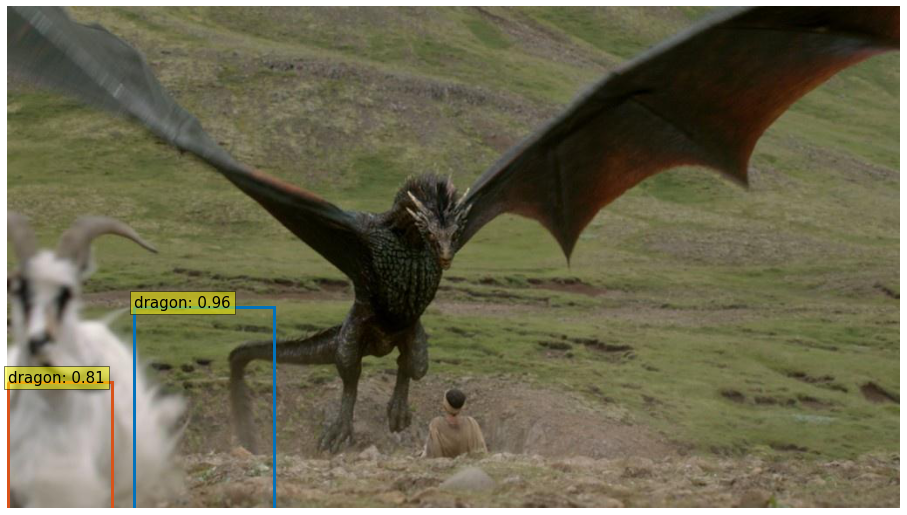

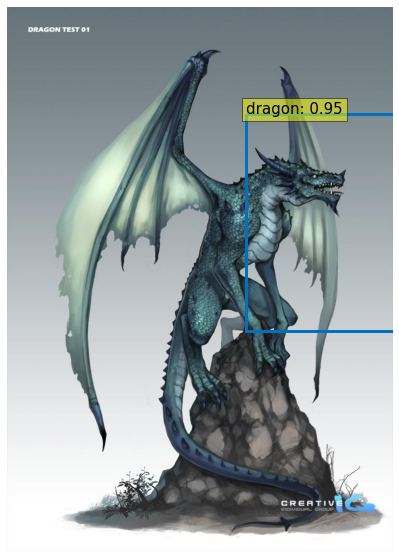

...

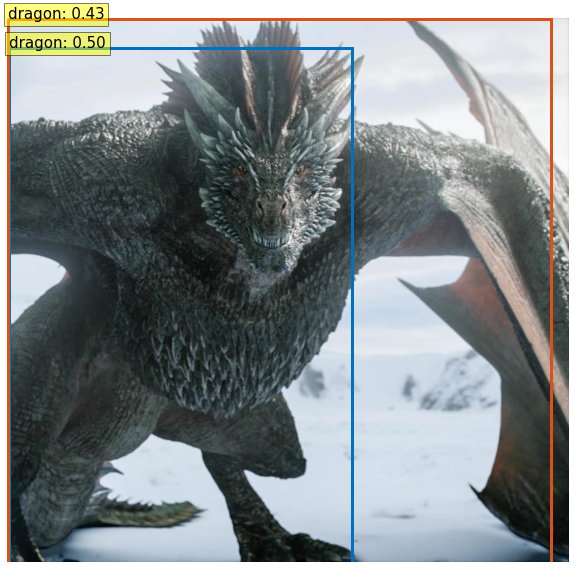

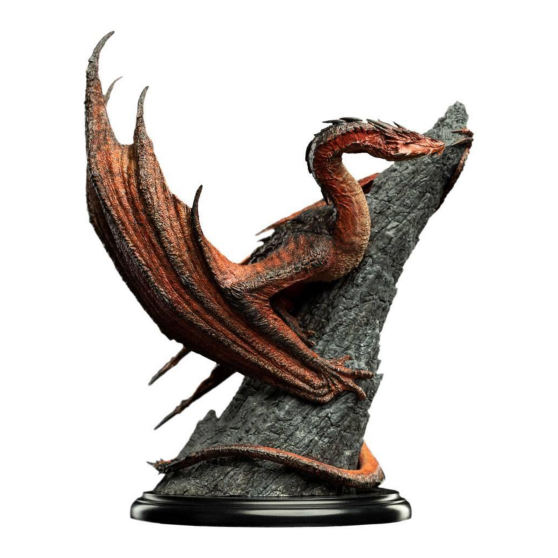

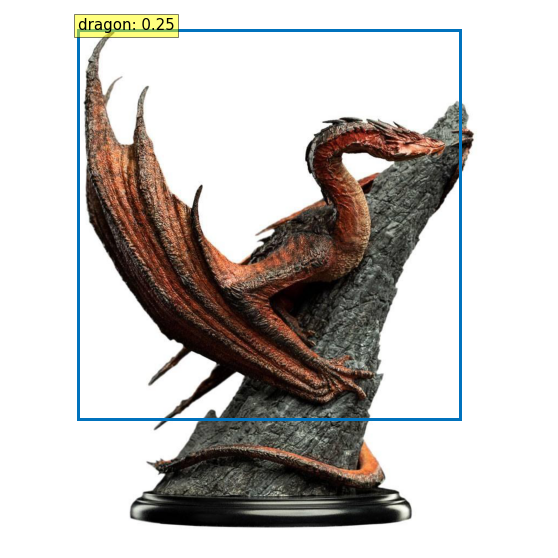

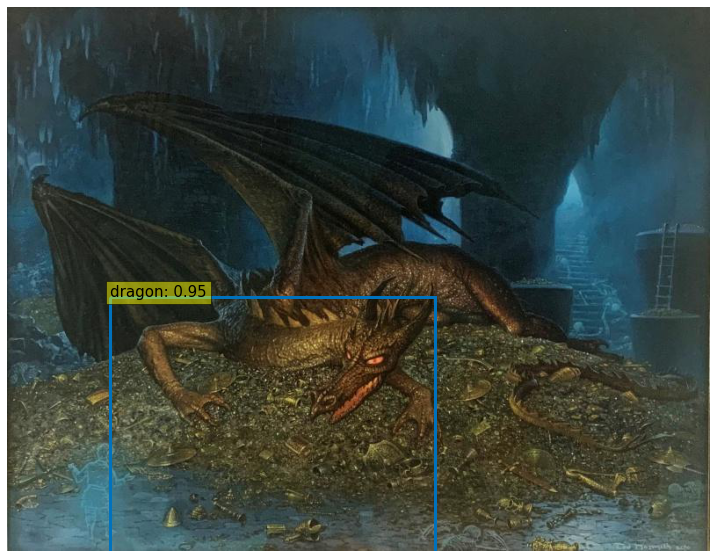

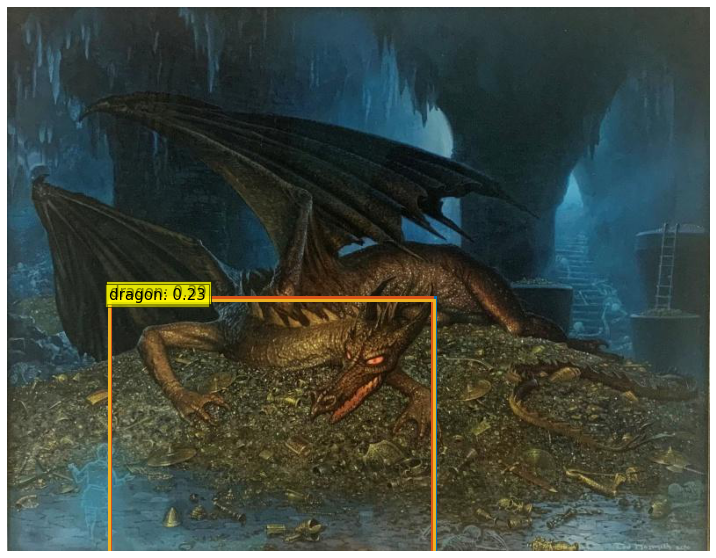

In [28]:
import os
from PIL import Image

folder = "/content/dragon_data/data/val"
for img_name in os.listdir(folder):
    im = Image.open(Path(folder) / img_name)
    run_worflow(im, model)